# <b> MPO+ Neutrophil Cell Analysis <b>
This page contains the joined datasets from Initial Query and Reference Query with all MPO+ Cells.

## <b>Analysis<b>
The analysis was done by first isolating the Neutrophil using *MPO* as a marker.

Datasets were then merged by using the *harmonizepy* package.

After this was done different subsets of Neutrophils were marked as **N1** and **N2**, depending on a set of gene expression markers.

| **N1 Neutrophils** | **N2 Neutrophils** |
| --- | --- |
| CD11b (ITGAM) | CD11b (ITGAM) |
| CD16 (FCGR3B) | CD16 (FCGR3B) |
| CD66 (CEACAM1) | CD66 (CEACAM1) |
| CD177 (GPI) | CD177 (GPI) |
| ICAM1 | CD62L (SELL/L-selectin)|
| CXCL1 | CD206 (MRC1) |
| CXCL2 | |
| CXCL3 | |
| CXCL10 | |
| TNF | |
| MYD88 | |

**Author:** Carlos B. Sainz Zuñiga  
**Contact:** carlos.sainz@nottingham.ac.uk
**Affiliations:** PhD Candidate at the Hannan Lab under Nicholas RF. Hannan at the University of Nottingham.

---


In [32]:
#| hide-input
from datetime import datetime

print("Notebook run on:", datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

Notebook run on: 2026-01-26 03:42:54


In [3]:
#| remove-cell
import random
import scanpy as sc
import scanpy.external as sce
import anndata as adata
import numpy as np
import pandas as pd
import scipy
import os
import scipy.io as sio
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
import seaborn as sns
import gseapy
import scvi
import tempfile
import numba
import pooch
import pynndescent
import torch
import scipy.sparse as sp
import gdown
import gzip
import shutil
import urllib.request
from gprofiler import GProfiler
import celltypist
from celltypist import models
import warnings
import logging
from IPython.display import display, HTML
from sc_plot_and_embed import sc_plot_and_embed
from onedrive_share import onedrive_direct_link 

# Initialize the g:Profiler object
gp = GProfiler(return_dataframe=True)
print(gp.profile)

data_path = '/gpfs01/home/mzxcs8/Extra/Neutrophil_LAM_Phenotype_JohnsonLab/Analysis_LAM/'

<bound method GProfiler.profile of <gprofiler.gprofiler.GProfiler object at 0x146d5a0ba0d0>>


In [4]:
#| remove-cell
random.seed(1325)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
warnings.filterwarnings("ignore")
logging.getLogger().setLevel(logging.ERROR)
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=100, figsize=(6,5), format='tiff')
sc.settings.figdir = '/gpfs01/home/mzxcs8/Extra/Neutrophil_LAM_Phenotype_JohnsonLab/Analysis_LAM/_static/Figures'
OneDrive = 'https://uniofnottm.sharepoint.com/:f:/r/sites/MacrophagePaper/Shared%20Documents/General/Bioinformatics/Analysis%20for%20Publication/scRNASeq/LCC_Healthy/Figures?csf=1&web=1&e=BeWfn7'

### Joining All_LAM with reference Neutrophil Dataset (E-GEAD-867)

In [5]:
#| remove-cell
All_LAM = sc.read_h5ad('/gpfs01/home/mzxcs8/Extra/Neutrophil_LAM_Phenotype_JohnsonLab/All_LAM.h5ad')
EGEAD867_LAM = sc.read_h5ad('/gpfs01/home/mzxcs8/Extra/Neutrophil_LAM_Phenotype_JohnsonLab/EGEAD867_LAM.h5ad')

In [6]:
#| remove-cell
# fixed_pipeline.py
import mygene
import pandas as pd
import scanpy as sc
import numpy as np

mg = mygene.MyGeneInfo()

# =====================================
# Step 0: Collect datasets
# =====================================
datasets = {
    'All_LAM': All_LAM,
    'EGEAD867_LAM': EGEAD867_LAM   
}

# Build reference gene set as union (keep any gene present in any dataset)
reference_genes = set().union(*(ad.var_names for ad in datasets.values()))
print(f"Reference gene set (union): {len(reference_genes)} genes")

# =====================================
# Step 1: Gene mapping
# =====================================
def build_gene_mapping(gene_list, reference_set, dataset_name):
    """
    Map Ensembl IDs, symbols, or aliases to HGNC symbols,
    prioritizing reference_set membership.

    Returns:
        mapping (dict): query -> mapped ID
        unmapped_df (pd.DataFrame): queries that could not be mapped
    """
    # Query mygene (ask for both 'ensembl.gene' and 'ensembl' to capture both formats)
    res = mg.querymany(
        list(gene_list),
        scopes=["ensembl.gene", "symbol", "alias", "ensembl"],
        fields="symbol,ensembl.gene,ensembl,alias",
        species="human",
        as_dataframe=True,
    )

    mapping = {}
    unmapped_records = []  # store info for dataframe

    # iterate rows (each query)
    for query, row in res.iterrows():
        # mygene returns a 'notfound' column for missing queries
        if isinstance(row, pd.Series) and row.get("notfound"):
            unmapped_records.append(
                {"dataset": dataset_name, "query": query, "reason": "notfound"}
            )
            continue

        # Collect all possible identifiers
        candidates = set()

        # symbol
        symbol = row.get("symbol")
        if pd.notna(symbol):
            candidates.add(symbol)

        # ensembl.gene (string or list)
        ens_gene = row.get("ensembl.gene")
        if pd.notna(ens_gene):
            if isinstance(ens_gene, list):
                candidates.update(ens_gene)
            else:
                candidates.add(ens_gene)

        # ensembl (list of dicts or single dict) -> extract 'gene' keys
        ens_full = row.get("ensembl")
        if pd.notna(ens_full):
            if isinstance(ens_full, dict) and "gene" in ens_full:
                candidates.add(ens_full["gene"])
            elif isinstance(ens_full, list):
                for entry in ens_full:
                    if isinstance(entry, dict) and "gene" in entry:
                        candidates.add(entry["gene"])

        # alias (string or list)
        aliases = row.get("alias")
        if pd.notna(aliases):
            if isinstance(aliases, list):
                candidates.update(aliases)
            else:
                candidates.add(aliases)

        # Try to match against reference set (priority)
        match = next((c for c in candidates if c in reference_set), None)

        if match:
            mapping[query] = match
        elif symbol:  # fallback: use symbol if present
            mapping[query] = symbol
        else:
            unmapped_records.append(
                {"dataset": dataset_name, "query": query, "reason": "no_match_in_reference"}
            )

    unmapped_df = pd.DataFrame(unmapped_records)
    # ensure consistent columns even if empty
    if unmapped_df.empty:
        unmapped_df = pd.DataFrame(columns=["dataset", "query", "reason"])
    return mapping, unmapped_df


# =====================================
# Step 2: Harmonize + merge duplicates
# =====================================
def harmonize_and_merge(adata, reference_set, dataset_name, merge_method="sum", convert_sparse=True):
    """
    Rename genes to reference symbols, merge duplicates.
    Returns (adata_harmonized, unmapped_df).
    Parameters:
      - merge_method: "sum" (default) or "mean"
      - convert_sparse: if True, transiently convert sparse matrix to dense for grouping;
                        if False, will try a memory-friendly sparse approach (not implemented here).
    """
    print(f"\n--- Harmonizing {dataset_name} ---")
    mapping, unmapped_df = build_gene_mapping(adata.var_names, reference_set, dataset_name)

    # Keep a copy of original var names
    adata.var["old_names"] = adata.var_names

    # Apply mapping (map queries to mapped name or keep original)
    new_names = adata.var_names.to_series().map(lambda g: mapping.get(g, g))
    adata.var_names = new_names

    # If duplicates exist, merge them
    if adata.var_names.has_duplicates:
        ndup = adata.var_names.duplicated().sum()
        print(f"{dataset_name}: {ndup} duplicate gene names detected → merging ({merge_method})")

        # Convert to dense carefully — only if requested and if size allows
        if convert_sparse and hasattr(adata.X, "toarray"):
            X = adata.X.T.toarray()  # genes x cells
        else:
            # fallback to numpy conversion (may still be large)
            X = np.asarray(adata.X.T)

        # Create DataFrame with genes x cells
        df = pd.DataFrame(X, index=adata.var_names, columns=adata.obs_names)

        # Group by gene name and aggregate
        if merge_method == "sum":
            df2 = df.groupby(df.index).sum()
        elif merge_method == "mean":
            df2 = df.groupby(df.index).mean()
        else:
            raise ValueError("merge_method must be 'sum' or 'mean'")

        # Re-create AnnData (cells x genes)
        adata = sc.AnnData(df2.T, obs=adata.obs.copy())
        adata.var_names = df2.index
        adata.var_names.name = None

    # Final sanity-check: ensure var_names are strings
    adata.var_names = adata.var_names.astype(str)

    print(f"{dataset_name}: {adata.n_vars} genes after harmonization")
    return adata, unmapped_df


# =====================================
# Step 3: Apply harmonization & track unmapped
# =====================================
all_unmapped_list = []
harmonized_datasets = {}

for name, ad in datasets.items():
    adata_harmonized, unmapped_df = harmonize_and_merge(ad.copy(), reference_genes, name)
    harmonized_datasets[name] = adata_harmonized
    all_unmapped_list.append(unmapped_df)

# Concatenate unmapped into one DataFrame
all_unmapped = pd.concat(all_unmapped_list, ignore_index=True)

# =====================================
# Step 4: Concatenate (intersection or union as desired)
# =====================================
# Use join="outer" for union, "inner" for intersection across datasets
All_REF_LAM = sc.concat(
    list(harmonized_datasets.values()),
    join="outer",
    label="dataset",
    keys=list(harmonized_datasets.keys()),
)

print("\nFinal concatenated AnnData:")
print(f"Shape: {All_REF_LAM.shape}")   # (cells, genes)

# Show unmapped summary
print("\n⚠️ Unmapped genes summary:")
display(all_unmapped.head())


Input sequence provided is already in string format. No operation performed
querying 1-1000 ...


Reference gene set (union): 22871 genes

--- Harmonizing All_LAM ---


querying 1001-2000 ...
querying 2001-3000 ...
querying 3001-4000 ...
querying 4001-5000 ...
querying 5001-6000 ...
querying 6001-7000 ...
querying 7001-8000 ...
querying 8001-9000 ...
querying 9001-10000 ...
querying 10001-11000 ...
querying 11001-12000 ...
querying 12001-13000 ...
querying 13001-14000 ...
querying 14001-15000 ...
querying 15001-16000 ...
querying 16001-17000 ...
querying 17001-18000 ...
querying 18001-19000 ...
querying 19001-20000 ...
querying 20001-21000 ...
querying 21001-21030 ...
Finished.
1098 input query terms found dup hits:	[('7SK', 10), ('A2M', 2), ('ACAT1', 2), ('ACAT2', 2), ('ACP1', 2), ('ACTB', 2), ('ADAM20P1', 2), ('A
3879 input query terms found no hit:	['7SK-1', '7SK-2', 'AC000003.2', 'AC000032.2', 'AC000068.10', 'AC000068.5', 'AC000068.9', 'AC000124.
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


All_LAM: 21030 genes after harmonization


Input sequence provided is already in string format. No operation performed
querying 1-1000 ...



--- Harmonizing EGEAD867_LAM ---


querying 1001-2000 ...
querying 2001-3000 ...
querying 3001-4000 ...
querying 4001-5000 ...
querying 5001-6000 ...
querying 6001-7000 ...
querying 7001-8000 ...
querying 8001-9000 ...
querying 9001-10000 ...
querying 10001-11000 ...
querying 11001-12000 ...
querying 12001-13000 ...
querying 13001-13935 ...
Finished.
815 input query terms found dup hits:	[('ACAT1', 2), ('ACAT2', 2), ('ACP1', 2), ('ACTB', 2), ('ADA2', 2), ('ADCY3', 2), ('ADK', 2), ('AGPS
830 input query terms found no hit:	['CD11b:ICRF44|ITGAM|AHS0184|pAbO', 'CD11c:B-LY6|ITGAX|AHS0056|pAbO', 'CD127|IL7R|AHS0028|pAbO', 'CD
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


EGEAD867_LAM: 13935 genes after harmonization

Final concatenated AnnData:
Shape: (420799, 22871)

⚠️ Unmapped genes summary:


,dataset,query,reason
0,All_LAM,7SK,notfound
1,All_LAM,7SK,notfound
2,All_LAM,7SK,notfound
3,All_LAM,7SK,notfound
4,All_LAM,7SK,notfound


In [7]:
#| remove-cell
All_REF_LAM

AnnData object with n_obs × n_vars = 420799 × 22871
    obs: 'sample', 'dataset', 'n_genes', 'leiden', 'Cell_Type', 'NP_Only'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [8]:
#| remove-cell
All_REF_LAM.obs['sample'].value_counts()

sample
GSE135851_LAM3    57957
GSE190260_LAM3    57957
GSE190260_LAM2    37436
GSE135851_LAM2    37436
EGEAD867_HD6      24672
EGEAD867_HD1      21701
EGEAD867_MPA4     18199
GSE190260_LAM1    16700
GSE135851_LAM1    16700
EGEAD867_HD2      15843
EGEAD867_MPA3     15634
EGEAD867_HD3      14354
EGEAD867_HD7      14353
EGEAD867_HD5      13386
EGEAD867_MPA6     12516
EGEAD867_MPA5     12261
EGEAD867_HD4      11966
EGEAD867_MPA1     11445
EGEAD867_MPA2     10283
Name: count, dtype: int64

In [9]:
#| remove-cell
All_REF_LAM.obs['dataset'].value_counts()

dataset
All_LAM         224186
EGEAD867_LAM    196613
Name: count, dtype: int64

In [10]:
#| remove-cell
# Run PCA
#sc.pp.scale(AT2_HLCA)                # optional but recommended
sc.tl.pca(All_REF_LAM, svd_solver="arpack")

sce.pp.harmony_integrate(All_REF_LAM, key = 'dataset')
'X_pca_harmony' in All_REF_LAM.obsm
True

2026-01-26 03:18:56,388 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2026-01-26 03:19:07,216 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2026-01-26 03:19:08,094 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2026-01-26 03:20:38,706 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2026-01-26 03:22:42,313 - harmonypy - INFO - Converged after 2 iterations
Converged after 2 iterations


True

In [11]:
#| remove-cell
print(f"Total counts in lcc_h_filt: {All_REF_LAM.X.sum()}")

Total counts in lcc_h_filt: 695729408.0


In [12]:
#| remove-cell
sc.pp.normalize_total(All_REF_LAM, target_sum=1e4)
sc.pp.log1p(All_REF_LAM)

#if sp.issparse(AT2_HLCA.X):
#    AT2_HLCA.X = AT2_HLCA.X.toarray()  # Convert sparse to dense matrix
#AT2_HLCA.X.shape

All_REF_LAM.obsm['X_pca'] = All_REF_LAM.obsm['X_pca_harmony']

In [13]:
#| remove-cell
sc.pp.neighbors(All_REF_LAM)
sc.tl.umap(All_REF_LAM)
sc.tl.leiden(All_REF_LAM,flavor = "igraph", resolution=0.5, n_iterations = 2)
sc.tl.dendrogram(All_REF_LAM, groupby = "leiden")

##### Unifold Manifold and Approximation (**UMAP**), also known as **TSNE**, plots.
- **leiden**: Shows the 'leiden' clusters that were made. These clusters of cells are done based on their transcriptomic similarities. Showing potential cell populations based on their most differentially expressed set of genes on each population.
- **dataset**: Shows a colorcoded umap based on the dataset the samples come from.
- **sample**: Shows a colorcoded umap based on the samples it contains. 

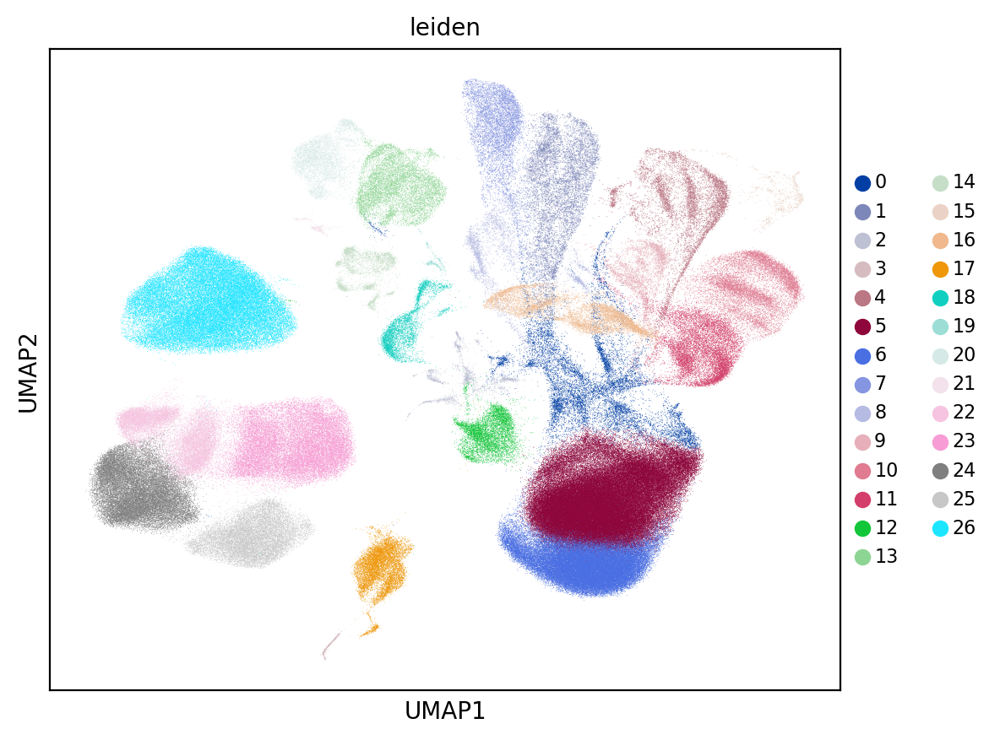

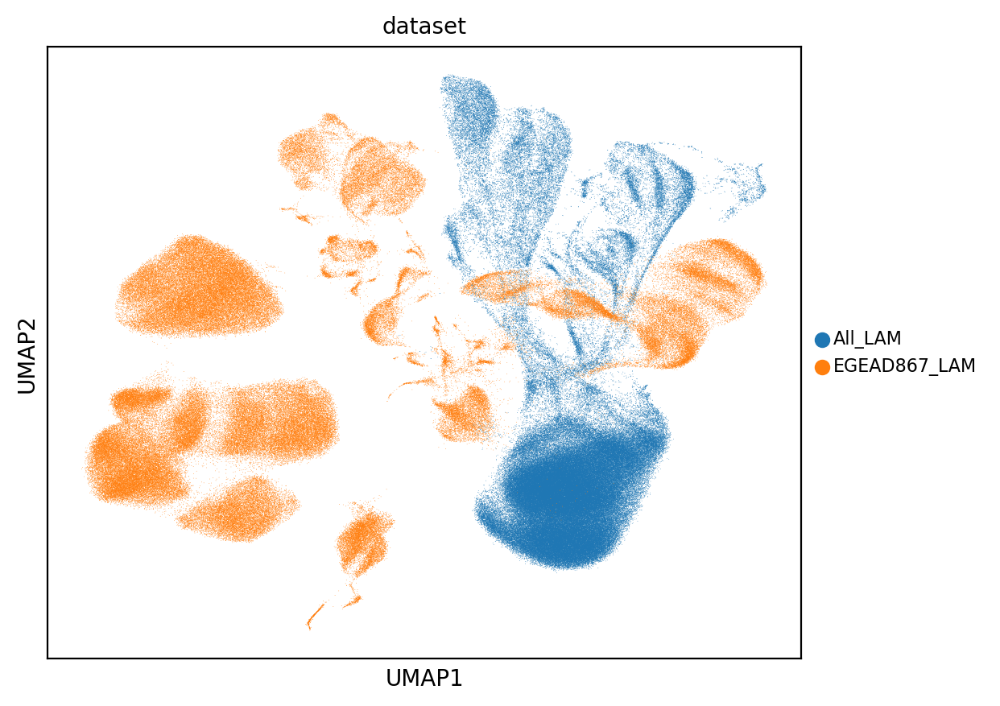

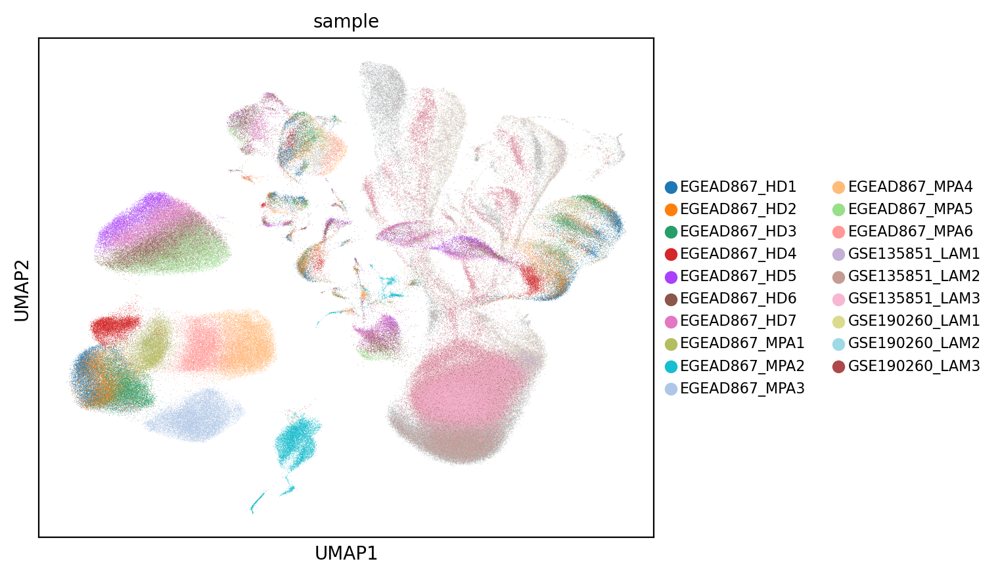

In [14]:
#| hide-input
sc.pl.umap(All_REF_LAM,color=['leiden'], legend_fontsize=8)
sc.pl.umap(All_REF_LAM,color=['dataset'], legend_fontsize=8)
sc.pl.umap(All_REF_LAM,color=['sample'], legend_fontsize=8)

##### UMAP showing expression of some Neutrophil markers within the population.

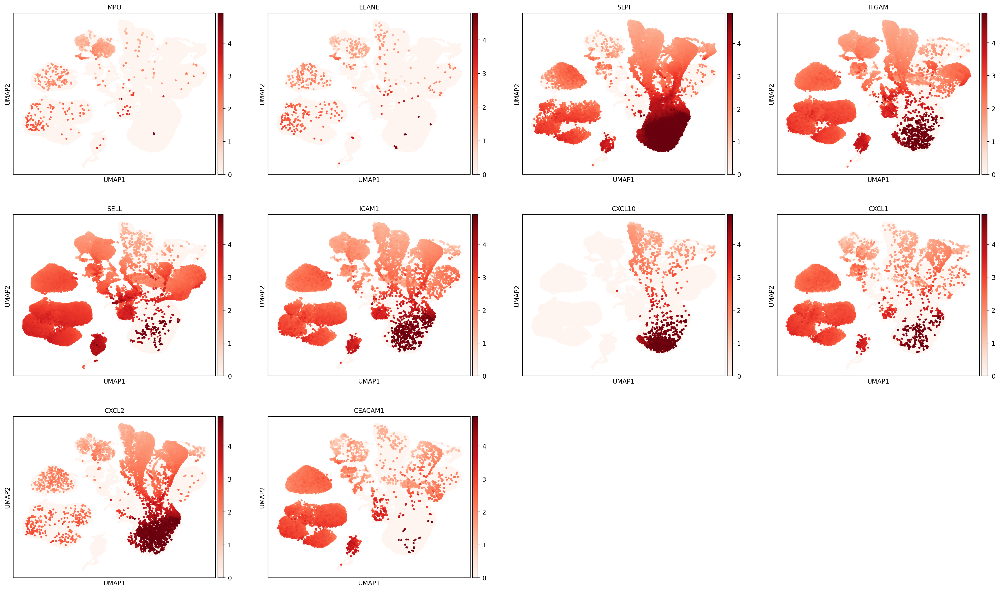

In [16]:
#| hide-input
sc.pl.umap(All_REF_LAM,color=['MPO','ELANE','SLPI','ITGAM','SELL','ICAM1','CXCL10','CXCL1','CXCL2','CEACAM1'], legend_fontsize=20, size = 40, cmap = 'Reds')

##### UMAP showing expression of some Neutrophil markers within the population.

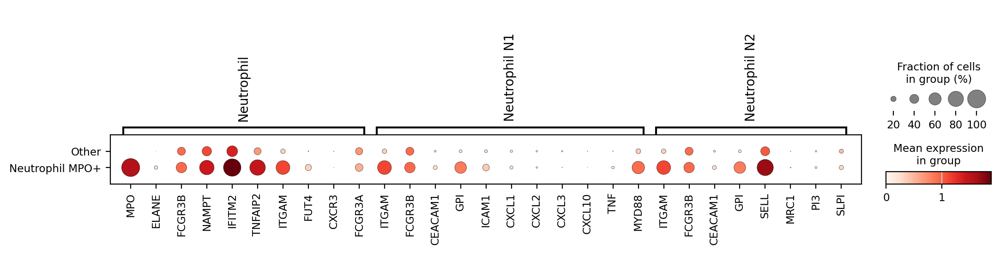

In [17]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}
sc.pl.dotplot(
    All_REF_LAM,
    marker_Neutrophil,
    groupby = ["Cell_Type"], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

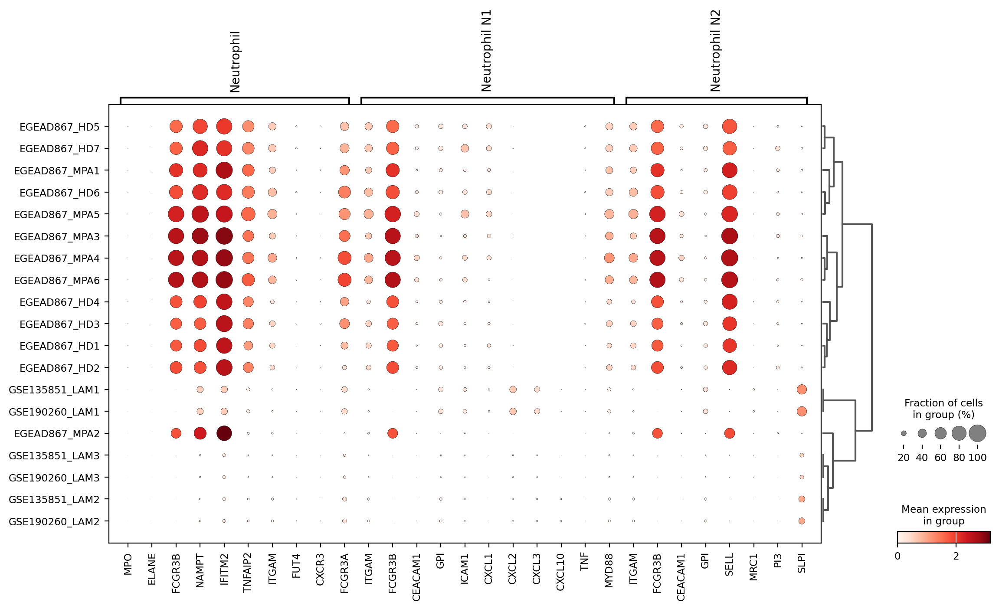

In [18]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}

sc.pl.dotplot(
    All_REF_LAM,
    marker_Neutrophil,
    groupby = ["sample"], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

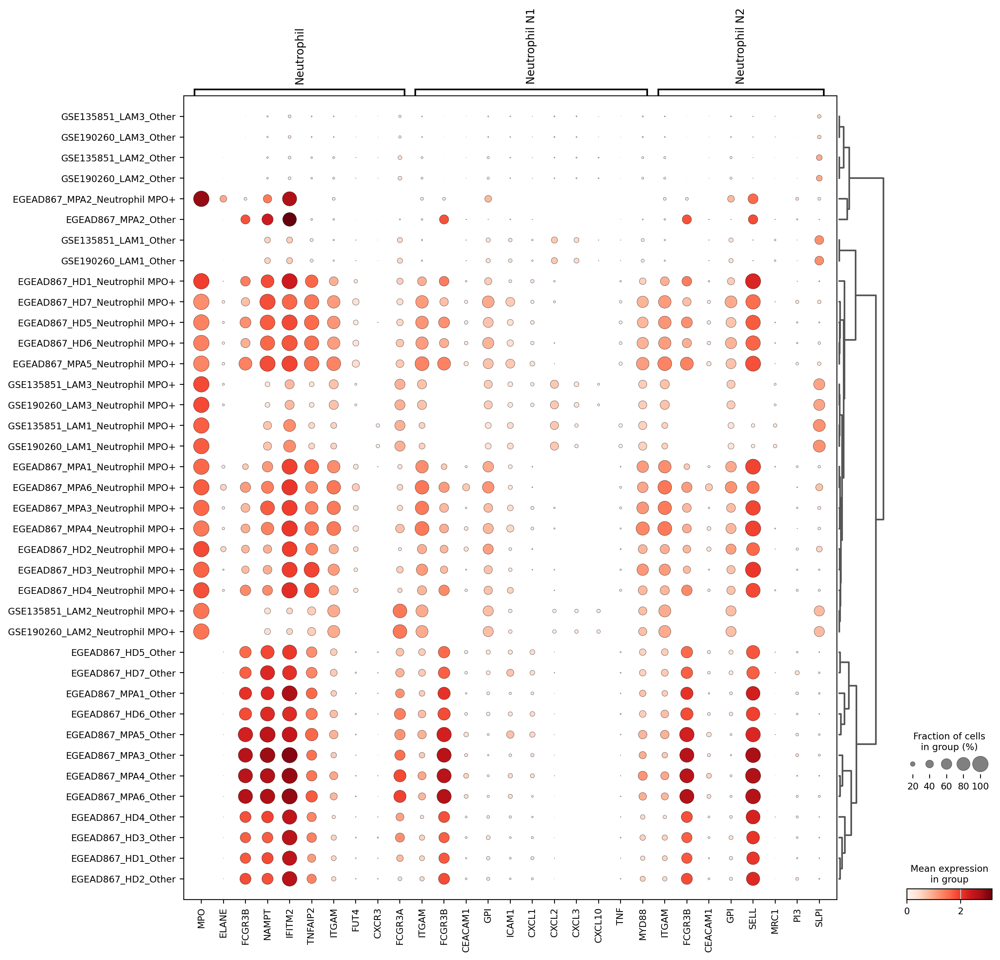

In [19]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}

sc.pl.dotplot(
    All_REF_LAM,
    marker_Neutrophil,
    groupby = ["sample",'Cell_Type'], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

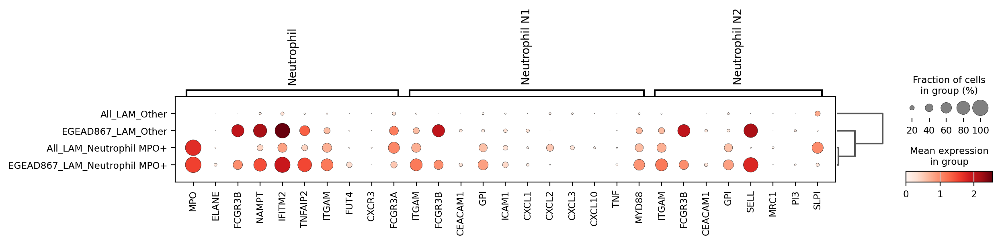

In [20]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}

sc.pl.dotplot(
    All_REF_LAM,
    marker_Neutrophil,
    groupby = ["dataset",'Cell_Type'], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

## MPO+ Cells Only
In here we remove all other cells from the dataset and only keep the MPO+ Cells extracted from each dataset, but on the joined and batch corrected samples.

In [21]:
#| remove-cell
All_NeutroMPO = All_REF_LAM[All_REF_LAM.obs["Cell_Type"] == "Neutrophil MPO+"].copy()

In [22]:
#| remove-cell
sc.pp.neighbors(All_NeutroMPO)
sc.tl.umap(All_NeutroMPO)
sc.tl.leiden(All_NeutroMPO,flavor = "igraph", resolution=0.5, n_iterations = 2)
sc.tl.dendrogram(All_NeutroMPO, groupby = "leiden")

##### Unifold Manifold and Approximation (**UMAP**), also known as **TSNE**, plots.
- **leiden**: Shows the 'leiden' clusters that were made. These clusters of cells are done based on their transcriptomic similarities. Showing potential cell populations based on their most differentially expressed set of genes on each population.
- **dataset**: Shows a colorcoded umap based on the dataset the samples come from.
- **sample**: Shows a colorcoded umap based on the samples it contains. 

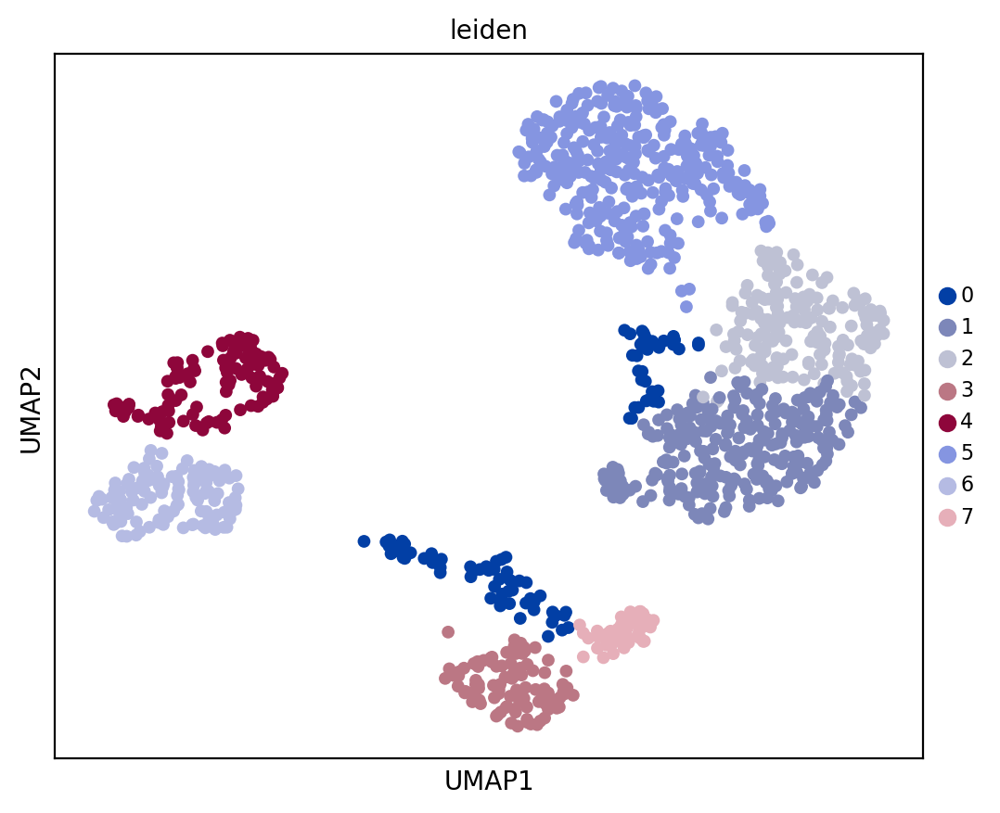

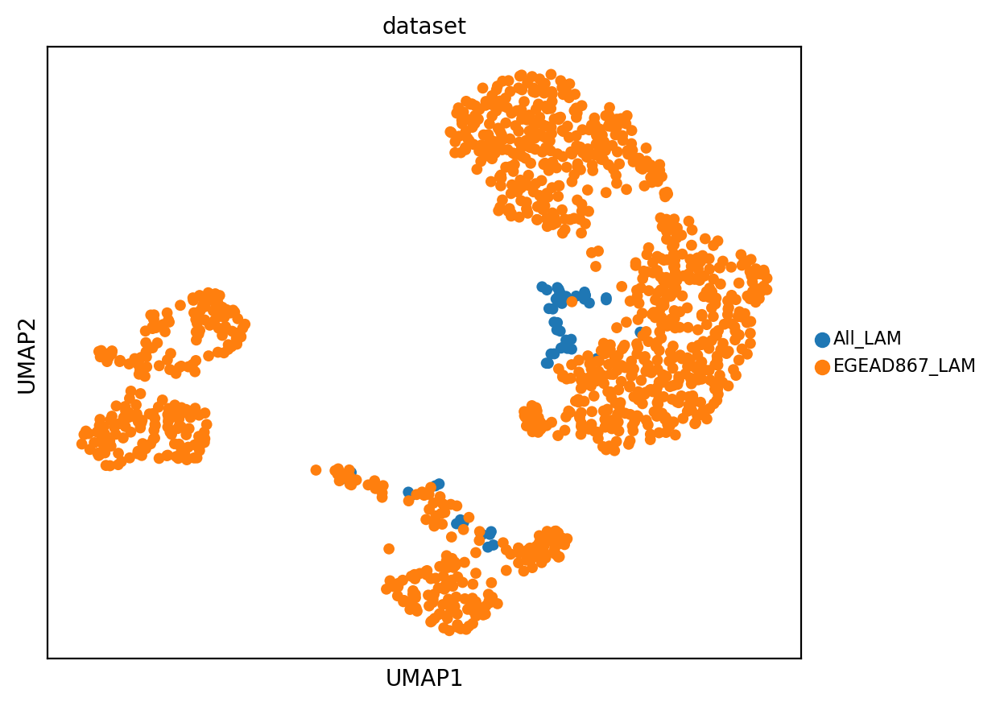

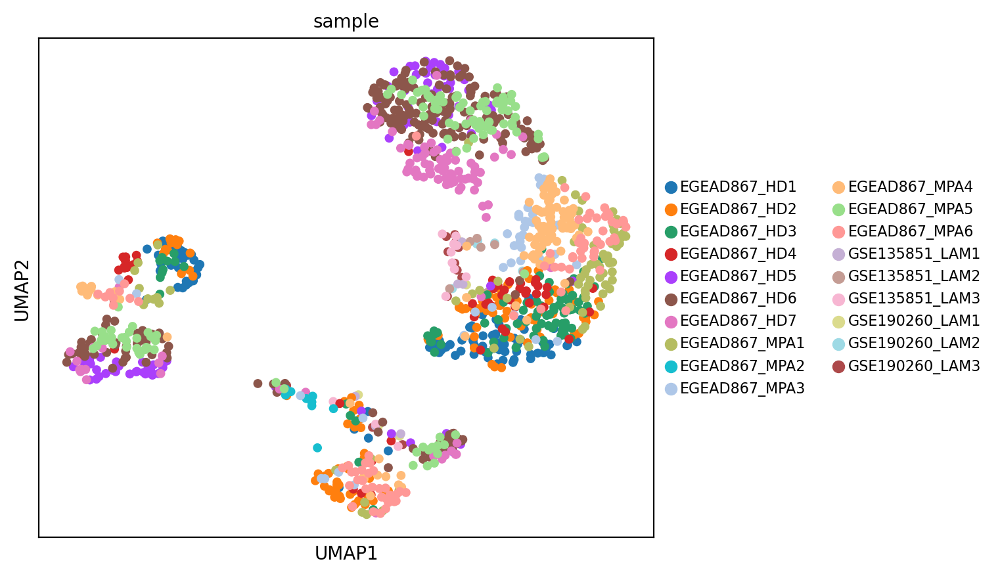

In [23]:
#| hide-input
sc.pl.umap(All_NeutroMPO,color=['leiden'], legend_fontsize=8)
sc.pl.umap(All_NeutroMPO,color=['dataset'], legend_fontsize=8)
sc.pl.umap(All_NeutroMPO,color=['sample'], legend_fontsize=8)

##### UMAP showing expression of some Neutrophil markers within the population.

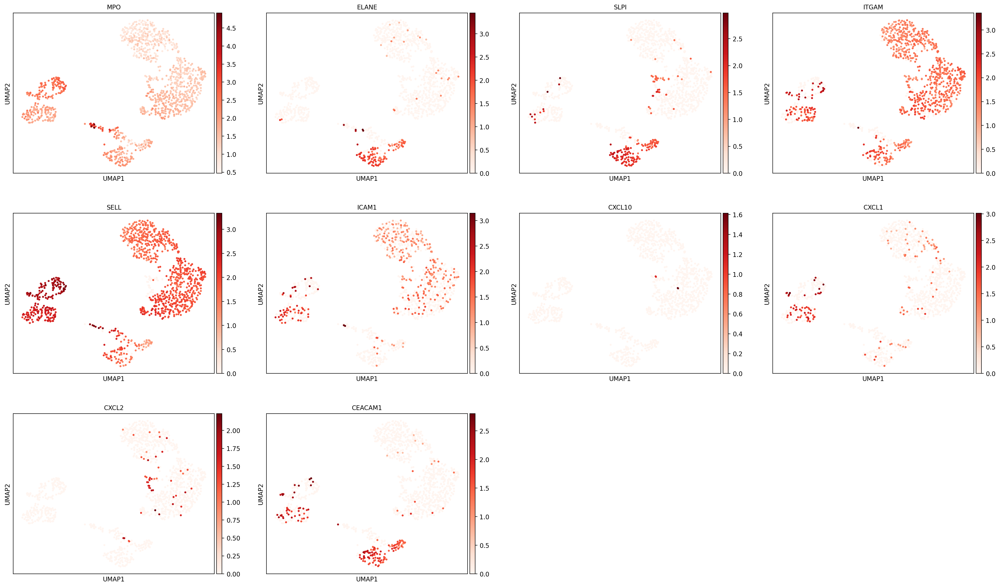

In [24]:
#| hide-input
sc.pl.umap(All_NeutroMPO,color=['MPO','ELANE','SLPI','ITGAM','SELL','ICAM1','CXCL10','CXCL1','CXCL2','CEACAM1'], legend_fontsize=20, size = 40, cmap = 'Reds')

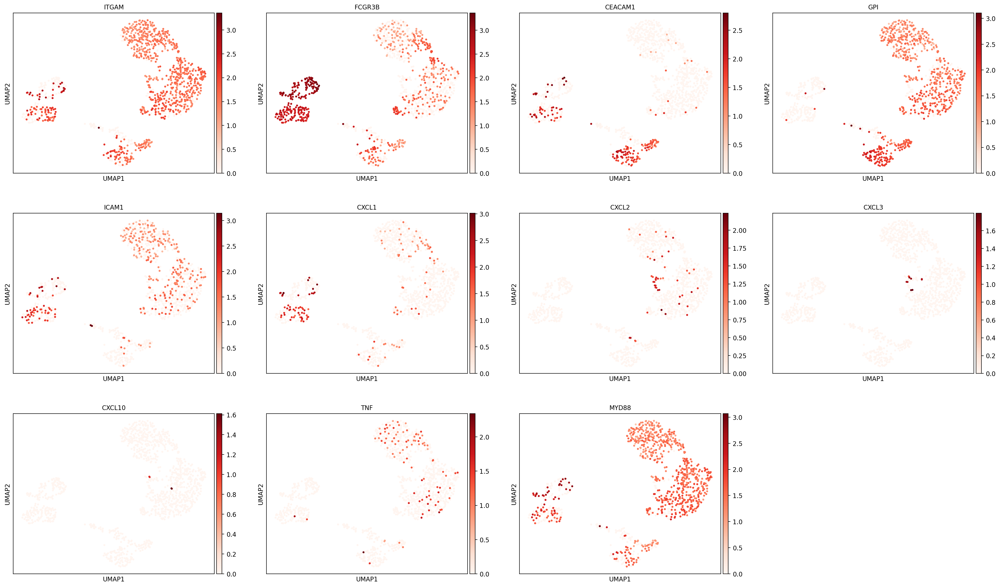

In [31]:
#| hide-input
sc.pl.umap(All_NeutroMPO,color=["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'], legend_fontsize=20, size = 40, cmap = 'Reds')

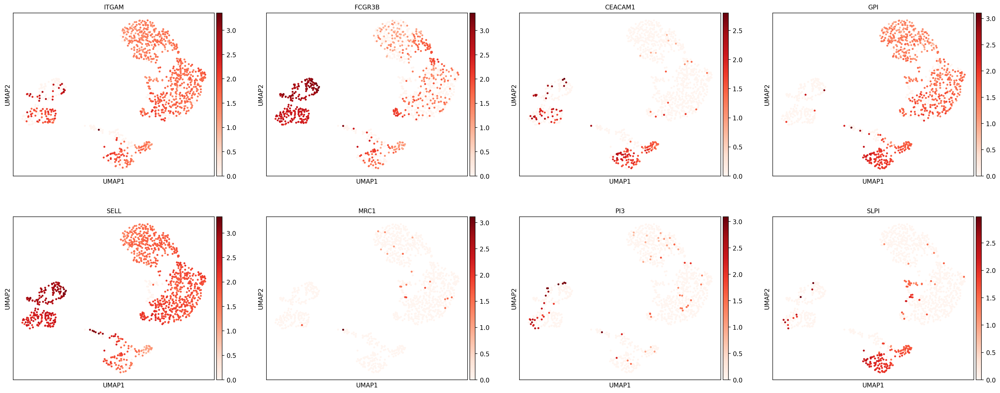

In [30]:
#| hide-input
sc.pl.umap(All_NeutroMPO,color=['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI'], 
           legend_fontsize=20, size = 40, cmap = 'Reds')

##### UMAP showing expression of some Neutrophil markers within the population.

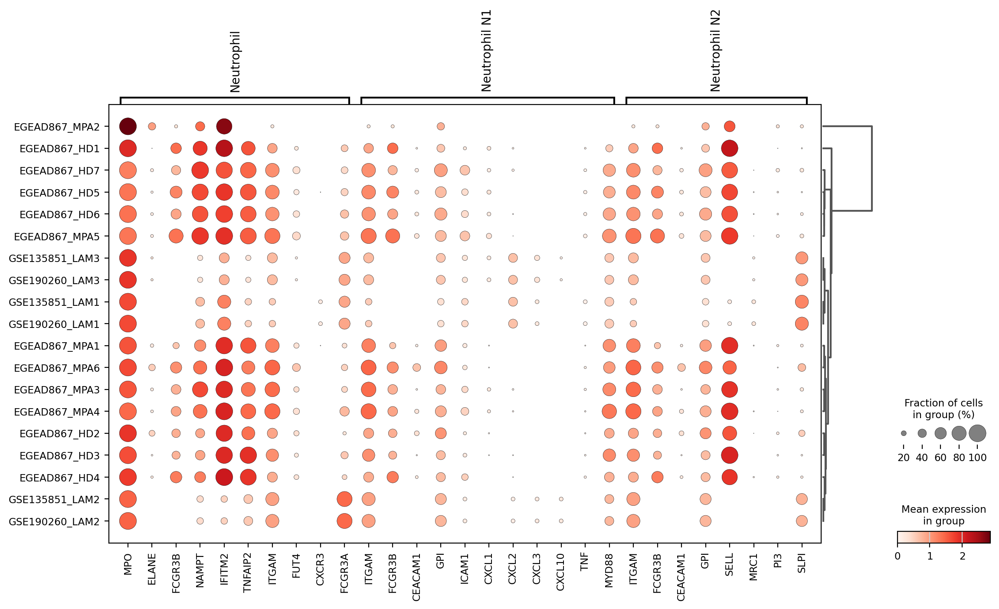

In [25]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}
sc.tl.dendrogram(All_NeutroMPO, groupby = ['sample'])
sc.pl.dotplot(
    All_NeutroMPO,
    marker_Neutrophil,
    groupby = ["sample"], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

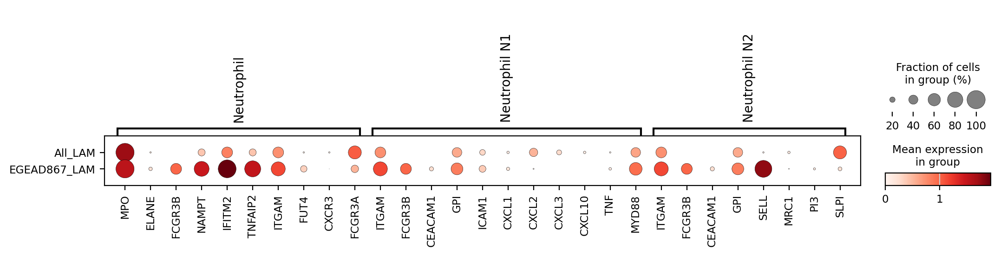

In [26]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}

sc.pl.dotplot(
    All_NeutroMPO,
    marker_Neutrophil,
    groupby = ["dataset"], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

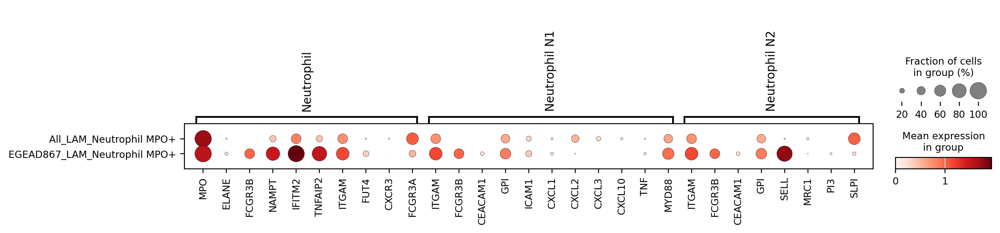

In [27]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}

sc.pl.dotplot(
    All_NeutroMPO,
    marker_Neutrophil,
    groupby = ["dataset",'Cell_Type'], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)

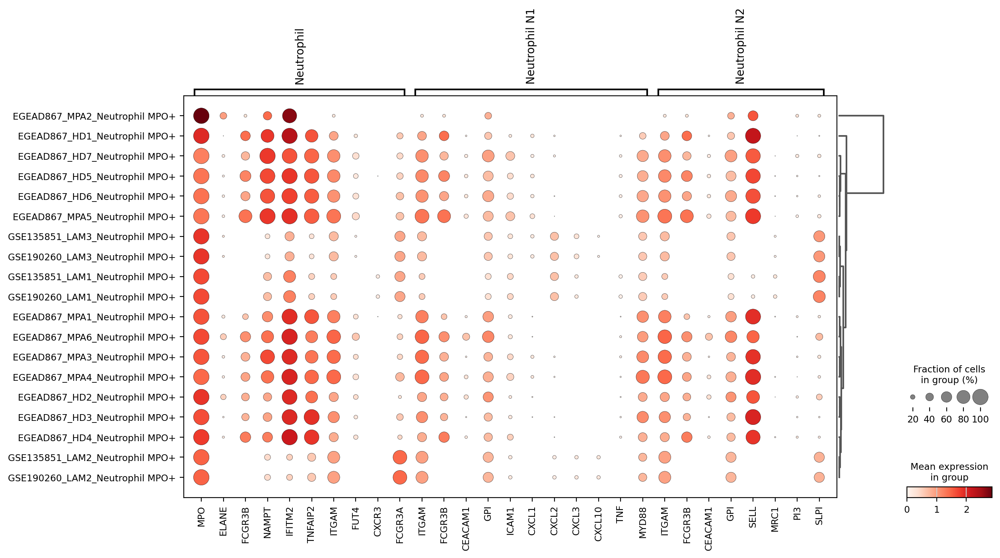

In [28]:
#| hide-input
marker_Neutrophil = {
    "Neutrophil": ['MPO','ELANE','FCGR3B','NAMPT','IFITM2','TNFAIP2','ITGAM','FUT4','CXCR3','FCGR3A'],
    "Neutrophil N1": ["ITGAM","FCGR3B","CEACAM1","GPI","ICAM1","CXCL1",'CXCL2','CXCL3','CXCL10','TNF','MYD88'],
    "Neutrophil N2": ['ITGAM','FCGR3B','CEACAM1','GPI','SELL','MRC1','PI3','SLPI']
}
sc.tl.dendrogram(All_NeutroMPO, groupby = ['sample','Cell_Type'])
sc.pl.dotplot(
    All_NeutroMPO,
    marker_Neutrophil,
    groupby = ["sample",'Cell_Type'], 
    dendrogram=True,
    use_raw=False,
    label = 'Dotplot of Neutrophil specific markers - Lam 2 Samples [GSE135851]'
)